<a href="https://colab.research.google.com/github/PraneethVasa/Nykaa-Chrun-Prediction/blob/main/Nyka.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
"""df1 = pd.read_csv(r'/content/Customer_Demographics_.csv')
df2 = pd.read_csv(r'/content/salesdata.csv')
df3 = pd.read_csv(r'/content/customerfeedback.csv')
df4 = pd.read_csv(r'/content/engagementmetrics.csv.csv')
df5 = pd.read_csv(r'/content/churnIndicators.csv')


merged_df = df1.merge(df2, on='CustomerID', how='outer') \
               .merge(df3, on='CustomerID', how='outer') \
               .merge(df4, on='CustomerID', how='outer') \
               .merge(df5, on='CustomerID', how='outer')


merged_df.to_csv('Nykaa_dataset.csv', index=False)

print(merged_df.head())"""


"df1 = pd.read_csv(r'/content/Customer_Demographics_.csv')\ndf2 = pd.read_csv(r'/content/salesdata.csv')\ndf3 = pd.read_csv(r'/content/customerfeedback.csv')\ndf4 = pd.read_csv(r'/content/engagementmetrics.csv.csv')\ndf5 = pd.read_csv(r'/content/churnIndicators.csv')\n\n\nmerged_df = df1.merge(df2, on='CustomerID', how='outer')                .merge(df3, on='CustomerID', how='outer')                .merge(df4, on='CustomerID', how='outer')                .merge(df5, on='CustomerID', how='outer')\n\n\nmerged_df.to_csv('Nykaa_dataset.csv', index=False)\n\nprint(merged_df.head())"

In [ ]:
df = pd.read_csv(r'/content/Nykaa_dataset.csv')

In [ ]:
df.head()

,CustomerID,Name,Age,Gender,Country,IncomeLevel,CustomerTier,Date,Product Type,Channel Type,Order Amount,support_interacation_count,problem type,support_resolution_time,resolution_satisfication,website_logins/day,browsing_time/hr,email_open_rate,ChurnIndicator
0,1,Roxine Stemp,42,Male,India,Low,Silver,10-04-2023,Skincare,Online,5638,6,Other,4,4,2,4.3,4,1
1,2,Gery Pressman,59,Male,India,Low,Silver,10-06-2023,Makeup,Offline,820,4,Side Effects,20,5,3,2.3,0,1
2,3,Odelinda Raspin,79,Female,India,Medium,Gold,03-08-2024,Skincare,Online,7526,8,Product Quality,12,6,6,3.7,6,0
3,4,Marve Curnick,23,Female,Singapore,High,Gold,02-06-2024,Skincare,Online,5696,3,Product Quality,7,7,7,1.1,4,0
4,5,Darn Barrett,39,Female,Qatar,Medium,Gold,02-10-2023,Haircare,Online,8886,9,Late Delivery,11,8,10,3.1,3,1


## ***Identifying Missing Values***

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 19 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   CustomerID                  15000 non-null  int64  
 1   Name                        15000 non-null  object 
 2   Age                         15000 non-null  int64  
 3   Gender                      15000 non-null  object 
 4   Country                     15000 non-null  object 
 5   IncomeLevel                 15000 non-null  object 
 6   CustomerTier                15000 non-null  object 
 7   Date                        15000 non-null  object 
 8   Product Type                15000 non-null  object 
 9   Channel Type                15000 non-null  object 
 10  Order Amount                15000 non-null  int64  
 11  support_interacation_count  15000 non-null  int64  
 12  problem type                15000 non-null  object 
 13  support_resolution_time     150

In [ ]:
df.describe()

,CustomerID,Age,Order Amount,support_interacation_count,support_resolution_time,resolution_satisfication,website_logins/day,browsing_time/hr,email_open_rate,ChurnIndicator
count,15000.000000,15000.000000,15000.000000,15000.000000,15000.00000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000
mean,7500.500000,46.582200,5691.515267,5.496067,12.43800,5.513800,5.002600,3.004220,3.006800,0.293933
std,4330.271354,22.554363,3038.833071,2.864076,6.93513,2.868372,3.157244,1.734127,1.994213,0.455577
min,1.000000,8.000000,400.000000,1.000000,1.00000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,3750.750000,27.000000,3033.750000,3.000000,6.00000,3.000000,2.000000,1.500000,1.000000,0.000000
50%,7500.500000,47.000000,5686.000000,5.000000,12.00000,6.000000,5.000000,3.000000,3.000000,0.000000
75%,11250.250000,66.000000,8329.000000,8.000000,19.00000,8.000000,8.000000,4.500000,5.000000,1.000000
max,15000.000000,85.000000,11000.000000,10.000000,24.00000,10.000000,10.000000,6.000000,6.000000,1.000000


In [ ]:
Numeric_df = df.select_dtypes(include='number')
Numeric_df

,CustomerID,Age,Order Amount,support_interacation_count,support_resolution_time,resolution_satisfication,website_logins/day,browsing_time/hr,email_open_rate,ChurnIndicator
0,1,42,5638,6,4,4,2,4.3,4,1
1,2,59,820,4,20,5,3,2.3,0,1
2,3,79,7526,8,12,6,6,3.7,6,0
3,4,23,5696,3,7,7,7,1.1,4,0
4,5,39,8886,9,11,8,10,3.1,3,1
...,...,...,...,...,...,...,...,...,...,...
14995,14996,40,4643,10,2,6,10,1.2,0,1
14996,14997,19,8497,10,20,3,1,0.4,5,0
14997,14998,77,10294,6,6,5,1,3.1,6,0
14998,14999,37,9749,4,22,7,4,5.1,0,0


In [ ]:
Numeric_df.corr()

,CustomerID,Age,Order Amount,support_interacation_count,support_resolution_time,resolution_satisfication,website_logins/day,browsing_time/hr,email_open_rate,ChurnIndicator
CustomerID,1.000000,0.014278,-0.007201,-0.002301,0.004618,0.004884,0.010753,0.002486,0.023031,0.009791
Age,0.014278,1.000000,0.002766,0.003190,-0.018158,-0.000597,0.007637,0.000928,0.000841,-0.000746
Order Amount,-0.007201,0.002766,1.000000,-0.007651,-0.002426,-0.004420,0.011994,-0.012620,-0.009920,-0.012386
support_interacation_count,-0.002301,0.003190,-0.007651,1.000000,-0.002243,-0.013287,0.005107,-0.010762,-0.000777,-0.006548
support_resolution_time,0.004618,-0.018158,-0.002426,-0.002243,1.000000,-0.010429,0.000213,0.007274,-0.000225,0.001917
resolution_satisfication,0.004884,-0.000597,-0.004420,-0.013287,-0.010429,1.000000,0.001965,0.018919,0.003900,-0.005120
website_logins/day,0.010753,0.007637,0.011994,0.005107,0.000213,0.001965,1.000000,0.002236,-0.007542,0.010408
browsing_time/hr,0.002486,0.000928,-0.012620,-0.010762,0.007274,0.018919,0.002236,1.000000,-0.001468,0.002109
email_open_rate,0.023031,0.000841,-0.009920,-0.000777,-0.000225,0.003900,-0.007542,-0.001468,1.000000,0.000222
ChurnIndicator,0.009791,-0.000746,-0.012386,-0.006548,0.001917,-0.005120,0.010408,0.002109,0.000222,1.000000


In [ ]:
Categorical_df = df.select_dtypes(exclude='number')

Categorical_df

,Name,Gender,Country,IncomeLevel,CustomerTier,Date,Product Type,Channel Type,problem type
0,Roxine Stemp,Male,India,Low,Silver,10-04-2023,Skincare,Online,Other
1,Gery Pressman,Male,India,Low,Silver,10-06-2023,Makeup,Offline,Side Effects
2,Odelinda Raspin,Female,India,Medium,Gold,03-08-2024,Skincare,Online,Product Quality
3,Marve Curnick,Female,Singapore,High,Gold,02-06-2024,Skincare,Online,Product Quality
4,Darn Barrett,Female,Qatar,Medium,Gold,02-10-2023,Haircare,Online,Late Delivery
...,...,...,...,...,...,...,...,...,...
14995,Barny Falk,Female,United States,Medium,Gold,04-10-2023,BodyCare,Offline,Product Quality
14996,Paxon Nare,Female,United States,Low,Gold,12-11-2023,Makeup,Offline,Product Quality
14997,Devonna McGeechan,Female,Australia,High,Gold,03-03-2023,Makeup,Online,Product Quality
14998,Katrine Biggins,Female,United States,Medium,Platinum,10/26/2024,BodyCare,Offline,Product Quality


In [ ]:
data = df
numeric_cols = data.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = data.select_dtypes(include=['object']).columns

## ***Univariate analysis for numerical columns***

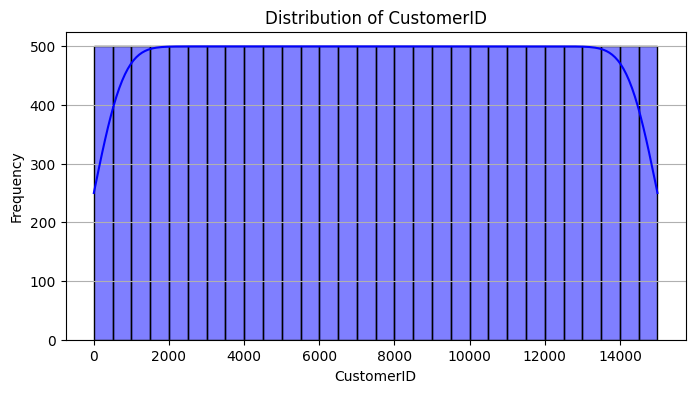

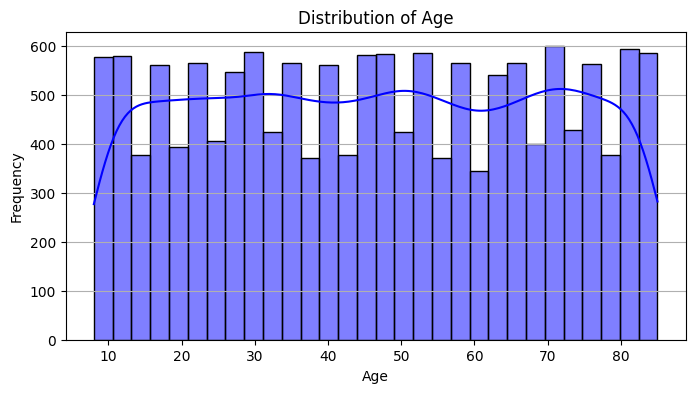

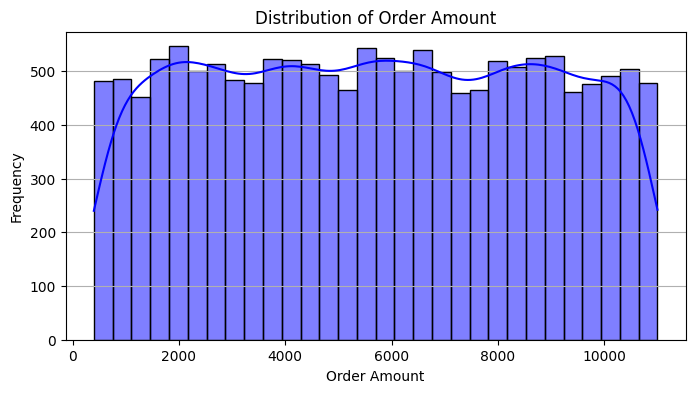

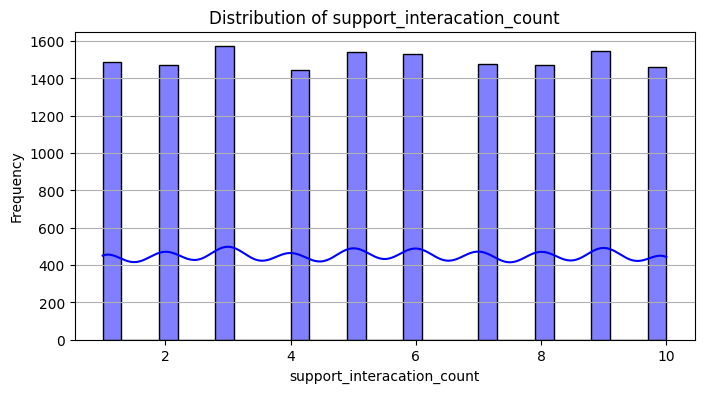

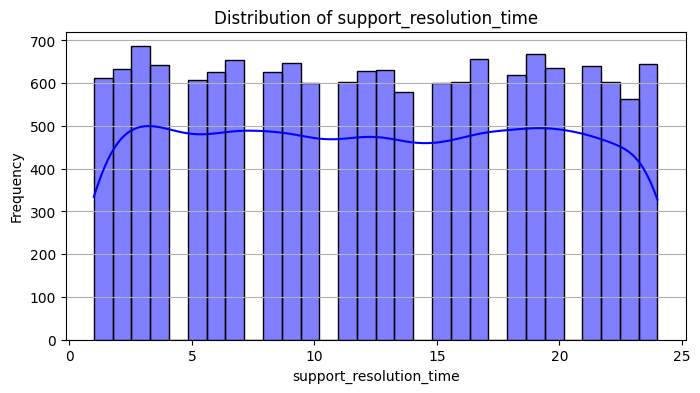

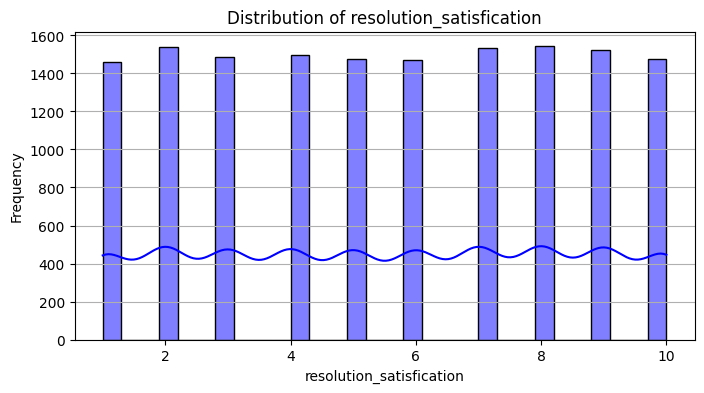

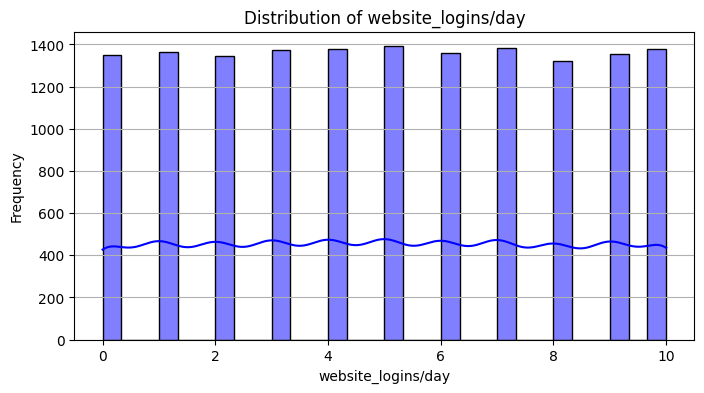

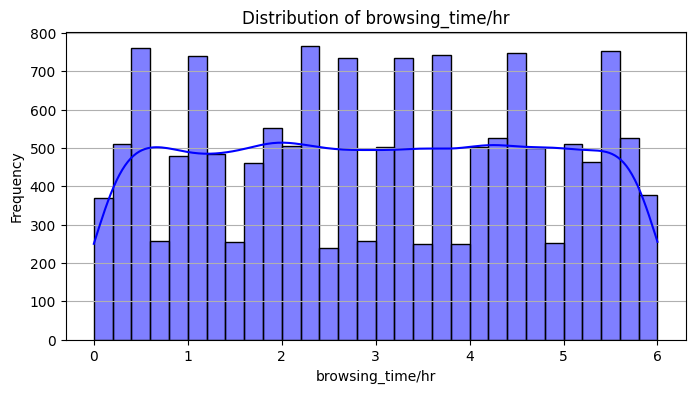

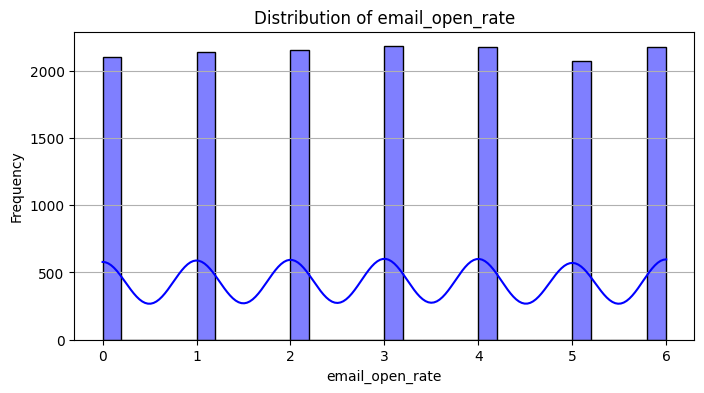

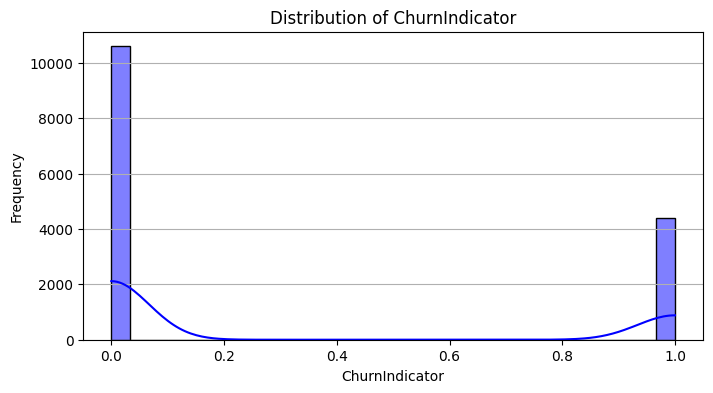

In [ ]:
# Define columns by type
data = df
numeric_cols = data.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = data.select_dtypes(include=['object']).columns

for col in numeric_cols:
    plt.figure(figsize=(8, 4))
    sns.histplot(data[col], kde=True, bins=30, color='blue')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.grid(axis='y')
    plt.show()
    print("\n\n")

## ***Univariate analysis for categorical columns***

<ipython-input-12-d3ba1fa4db45>:22: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


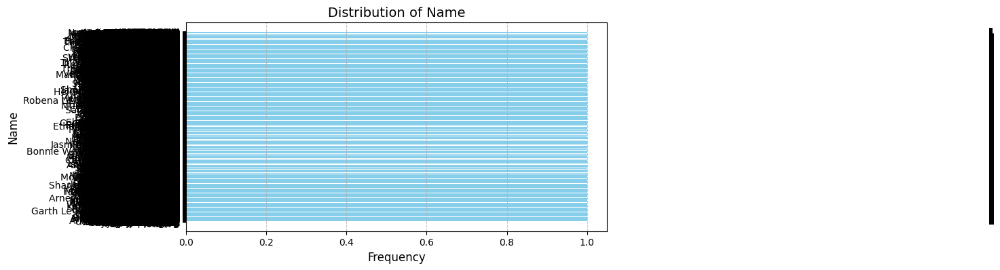

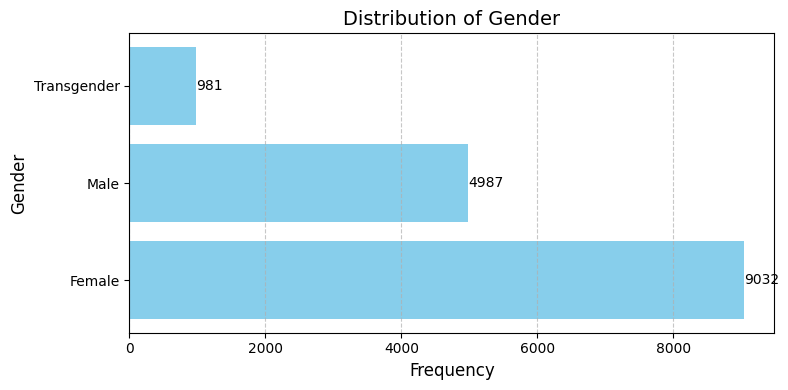

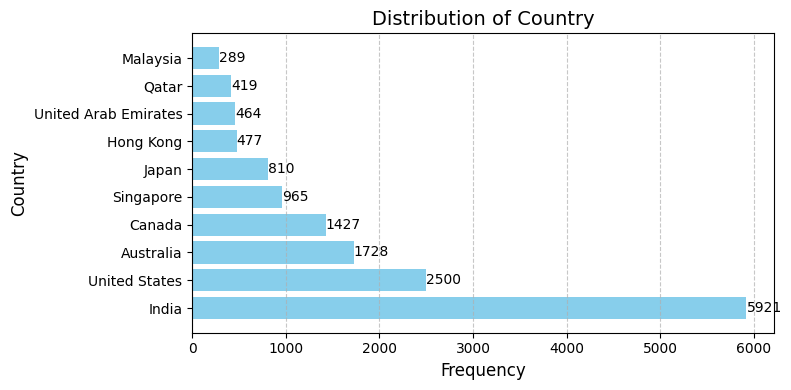

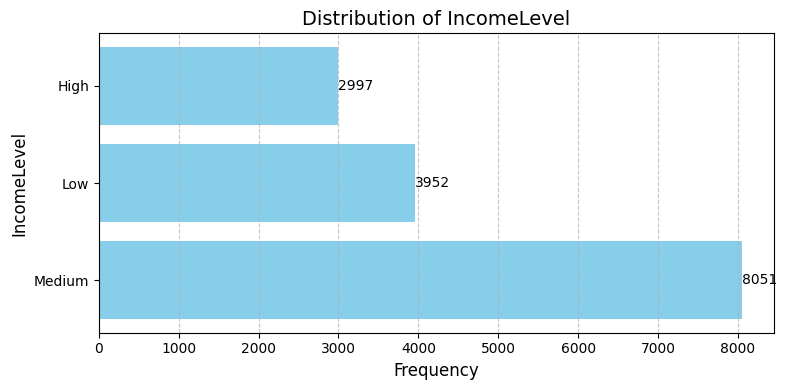

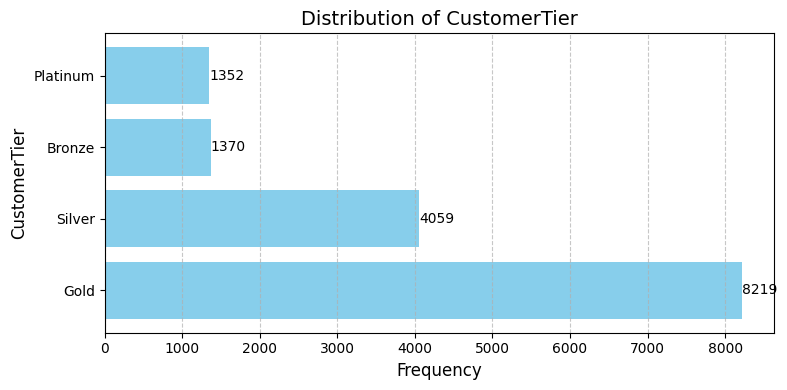

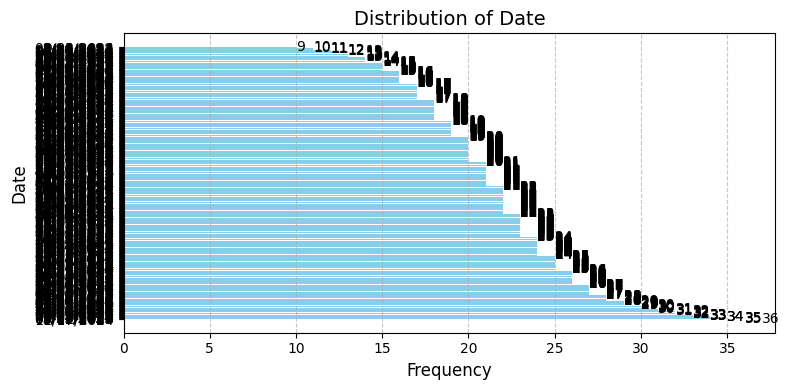

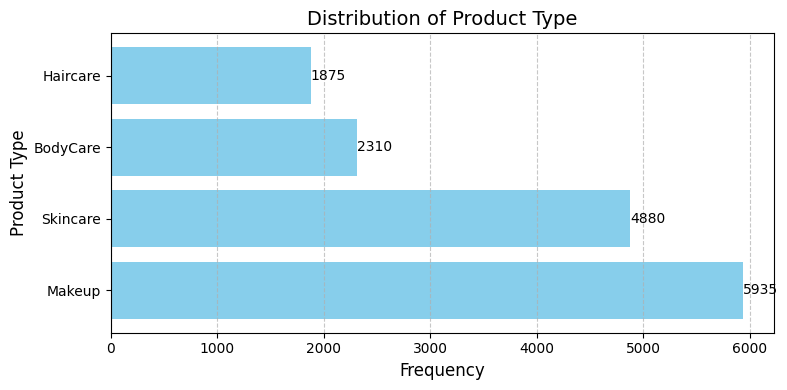

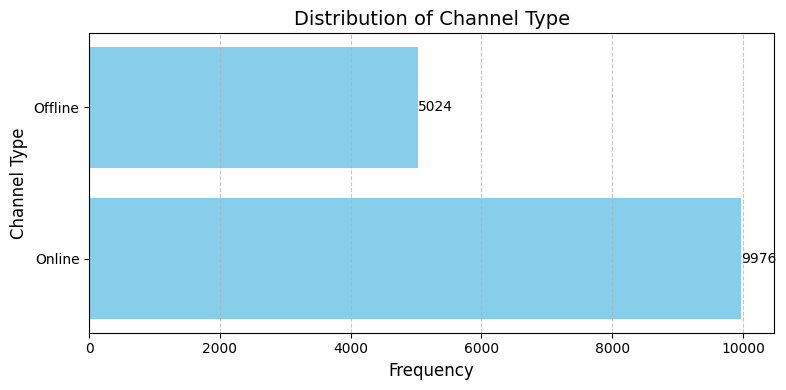

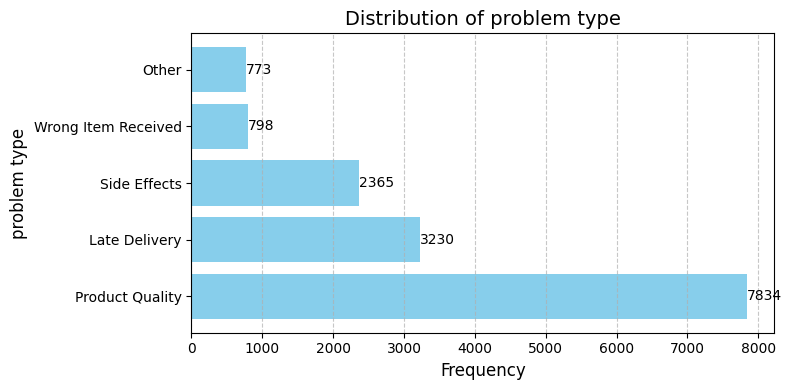

In [ ]:
# Loop through all categorical columns
for col in categorical_cols:
    plt.figure(figsize=(8, 4))

    # Calculate value counts for the column
    value_counts = data[col].value_counts()

    # Create a bar plot using Matplotlib
    plt.barh(value_counts.index, value_counts.values, color='skyblue')

    # Add labels and title
    plt.title(f'Distribution of {col}', fontsize=14)
    plt.xlabel('Frequency', fontsize=12)
    plt.ylabel(col, fontsize=12)

    # Display value annotations on bars
    for i, v in enumerate(value_counts.values):
        plt.text(v + 1, i, str(v), color='black', va='center', fontsize=10)

    # Grid and layout adjustments
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()
    print("\n\n")

## ***Bivariate Analysis - Numeric vs Numeric (Correlation and Scatter Plot)***

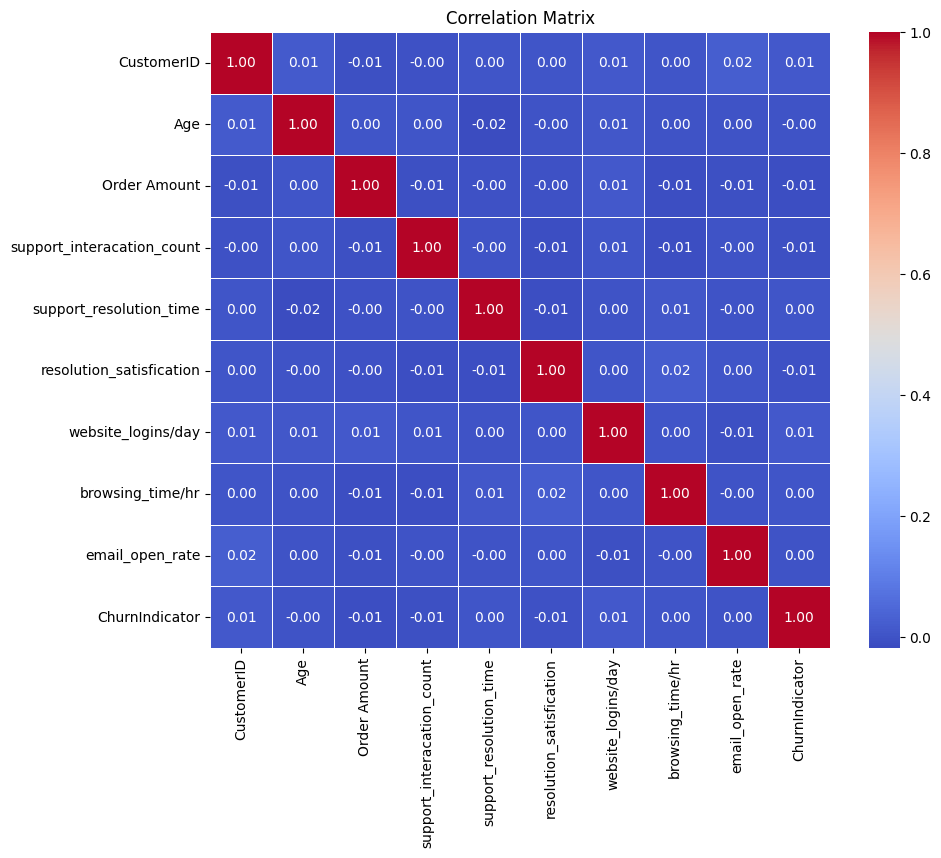

In [ ]:
# Correlation matrix
plt.figure(figsize=(10, 8))
corr_matrix = data[numeric_cols].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

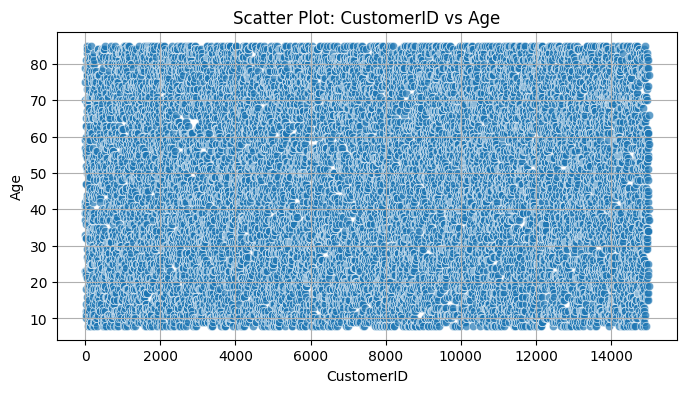

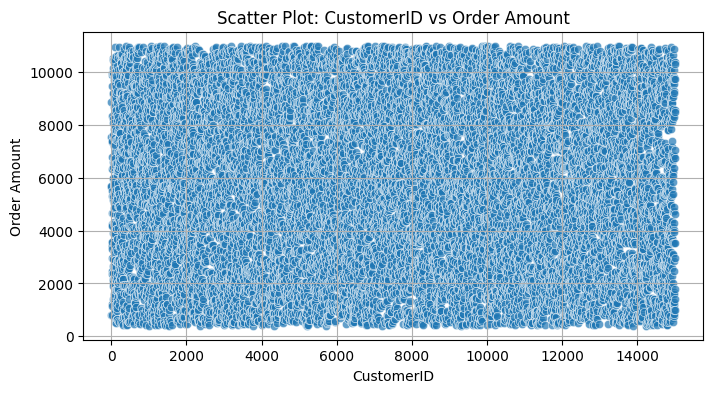

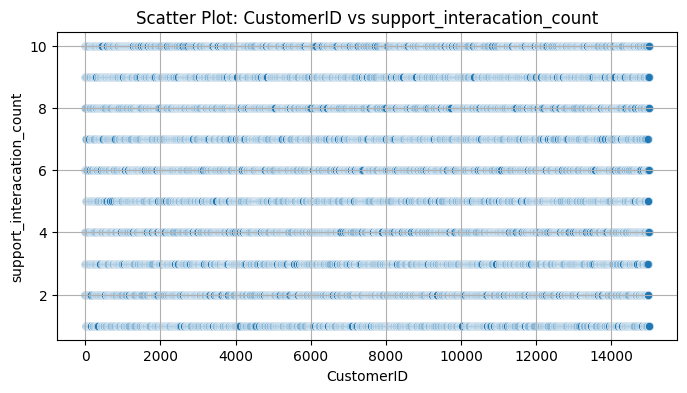

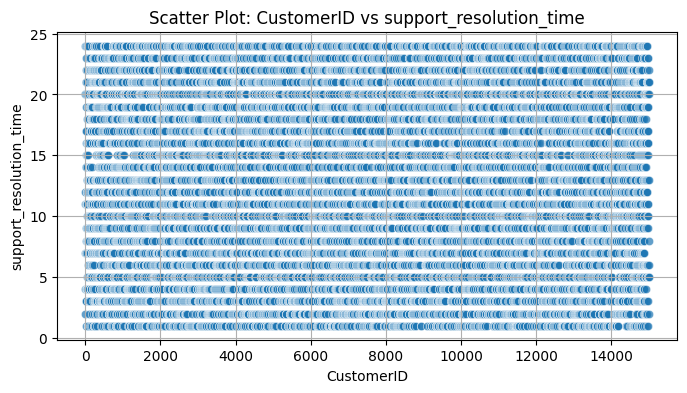

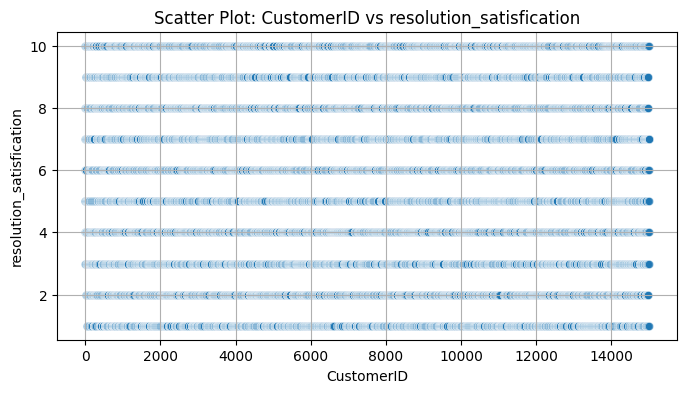

...

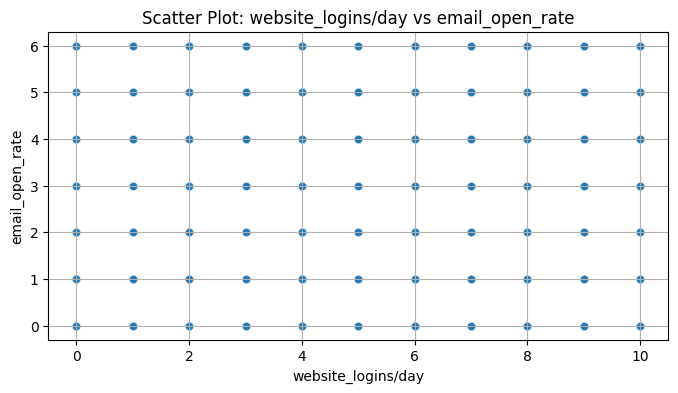

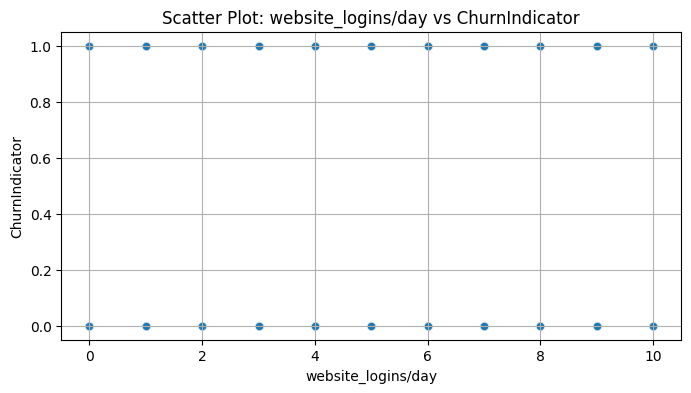

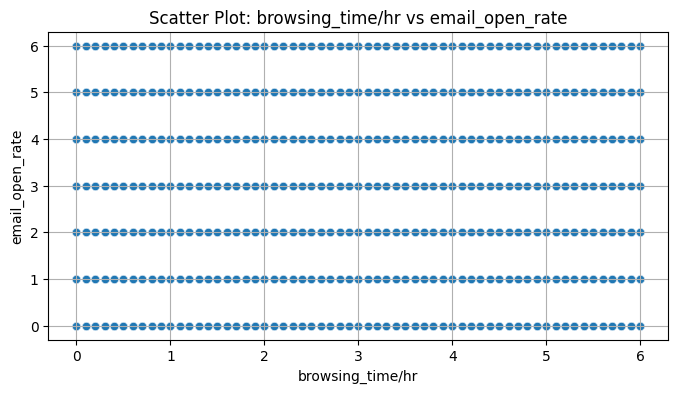

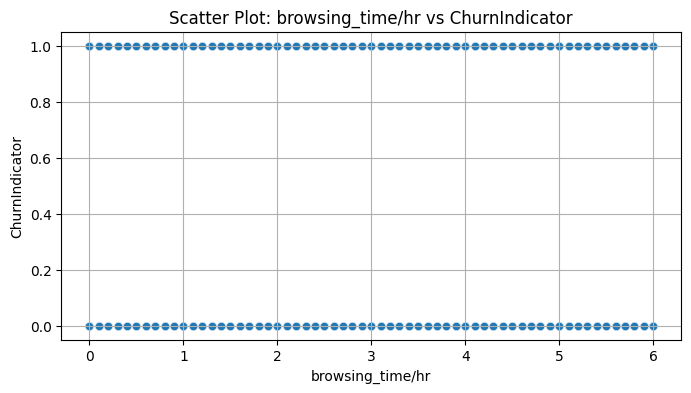

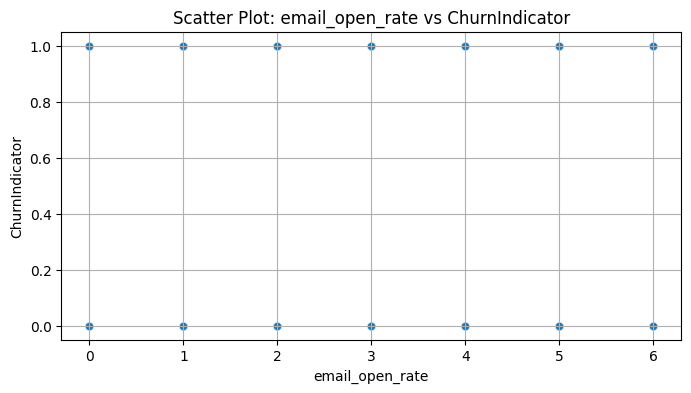

In [ ]:
# Scatter plots for each pair of numeric columns
for i, col1 in enumerate(numeric_cols):
    for col2 in numeric_cols[i + 1:]:
        plt.figure(figsize=(8, 4))
        sns.scatterplot(x=data[col1], y=data[col2], alpha=0.7)
        plt.title(f'Scatter Plot: {col1} vs {col2}')
        plt.xlabel(col1)
        plt.ylabel(col2)
        plt.grid(True)
        plt.show()

## ***Bivariate Analysis - Categorical vs Numeric (Box Plot)***

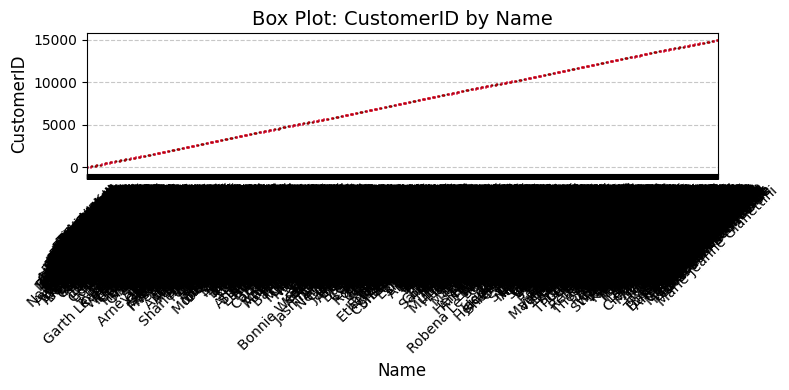

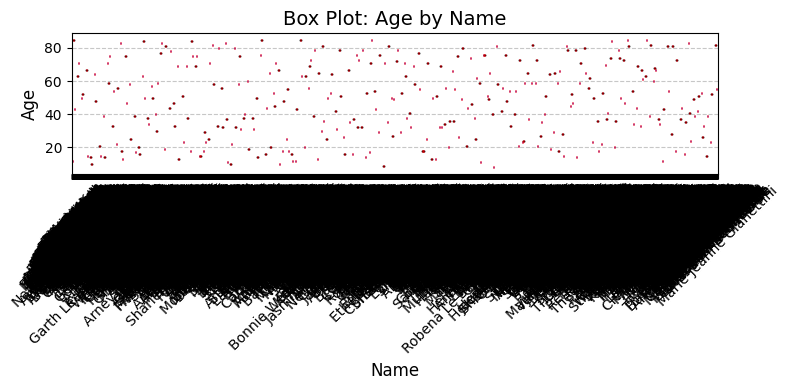

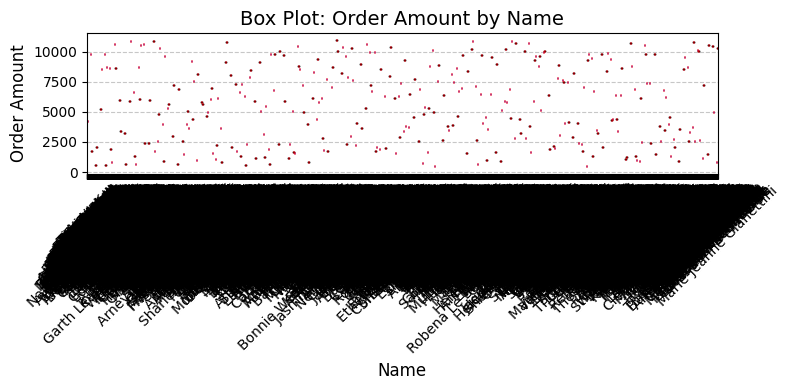

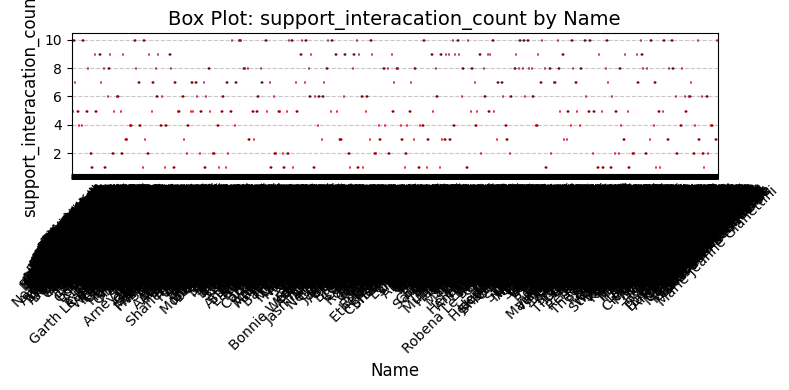

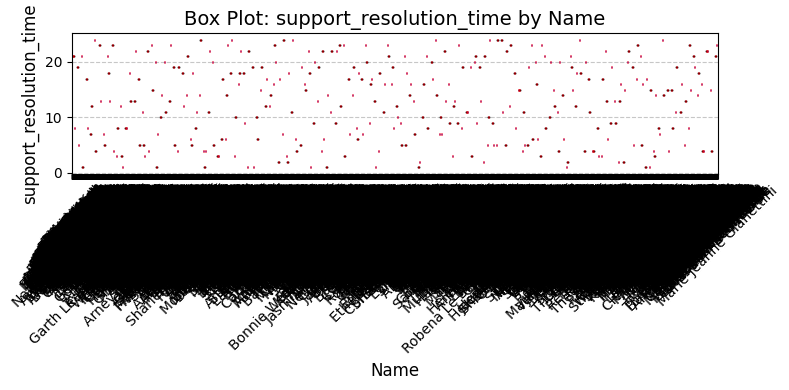

...

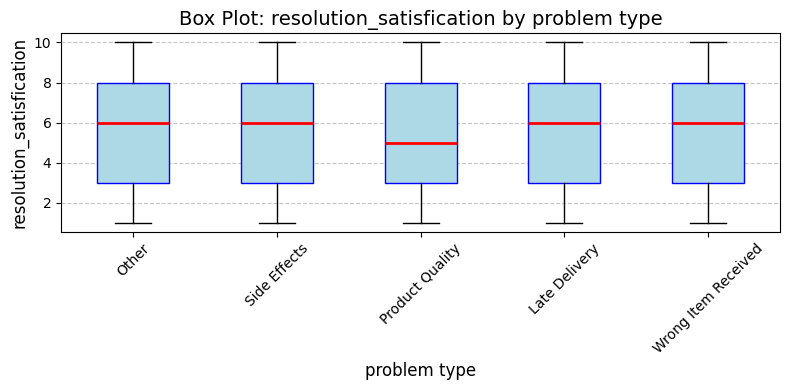

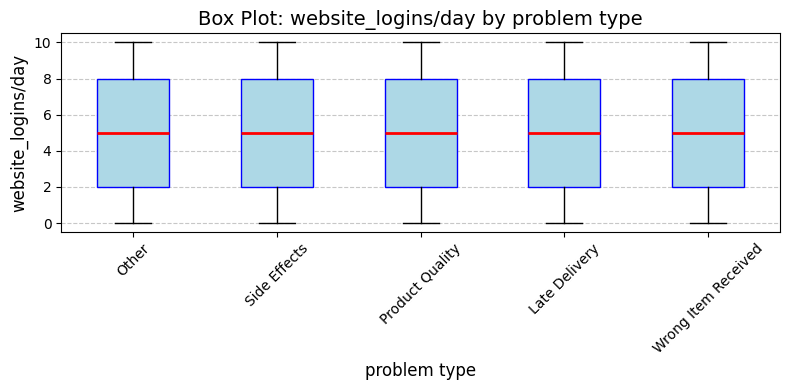

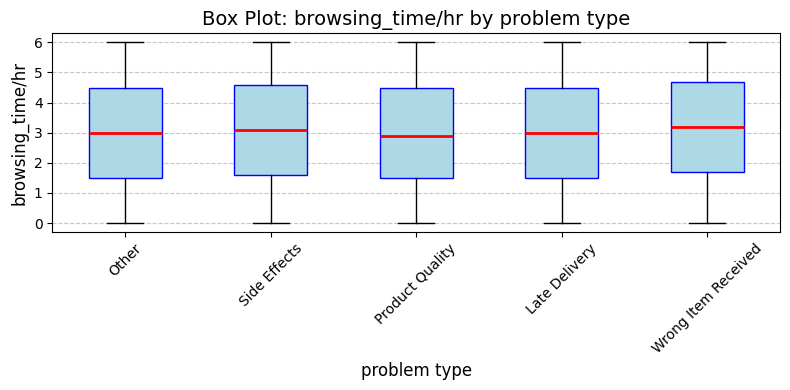

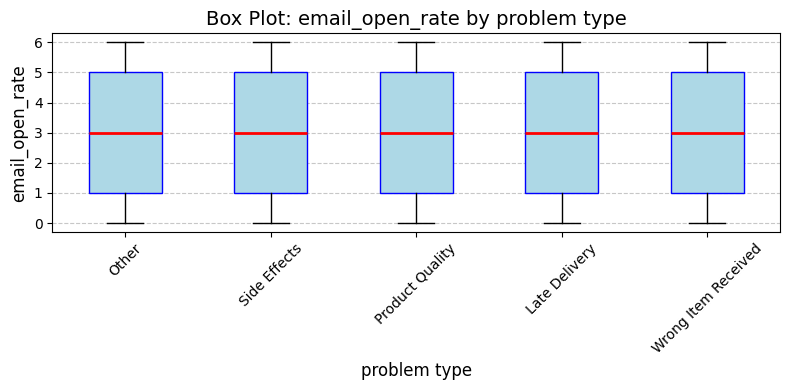

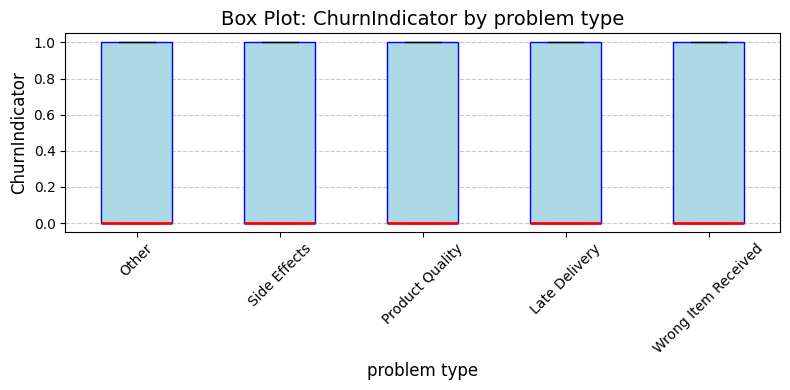

In [ ]:

# Loop through categorical and numeric columns
for cat_col in categorical_cols:
    for num_col in numeric_cols:
        plt.figure(figsize=(8, 4))

        # Create a box plot using Matplotlib
        data_to_plot = [data[data[cat_col] == category][num_col] for category in data[cat_col].unique()]
        plt.boxplot(data_to_plot, patch_artist=True, boxprops=dict(facecolor='lightblue', color='blue'),
                    medianprops=dict(color='red', linewidth=2))

        # Add labels and title
        plt.title(f'Box Plot: {num_col} by {cat_col}', fontsize=14)
        plt.xlabel(cat_col, fontsize=12)
        plt.ylabel(num_col, fontsize=12)
        plt.xticks(ticks=range(1, len(data[cat_col].unique()) + 1),
                   labels=data[cat_col].unique(), rotation=45, fontsize=10)

        # Grid and layout adjustments
        plt.grid(axis='y', linestyle='--', alpha=0.7)
        plt.tight_layout()
        plt.show()

## ***Bivariate Analysis - Categorical vs Categorical (Stacked Bar Plot)***

<Figure size 800x600 with 0 Axes>

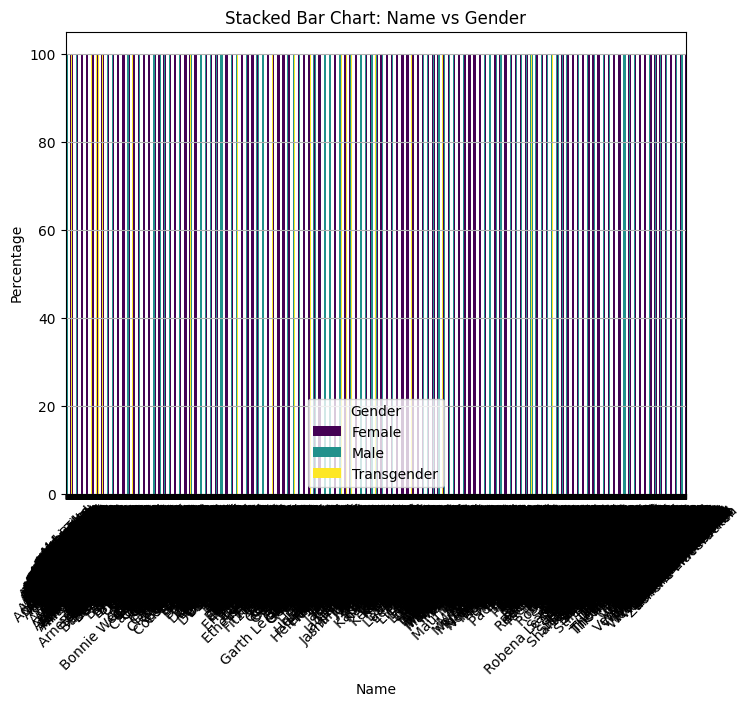

<Figure size 800x600 with 0 Axes>

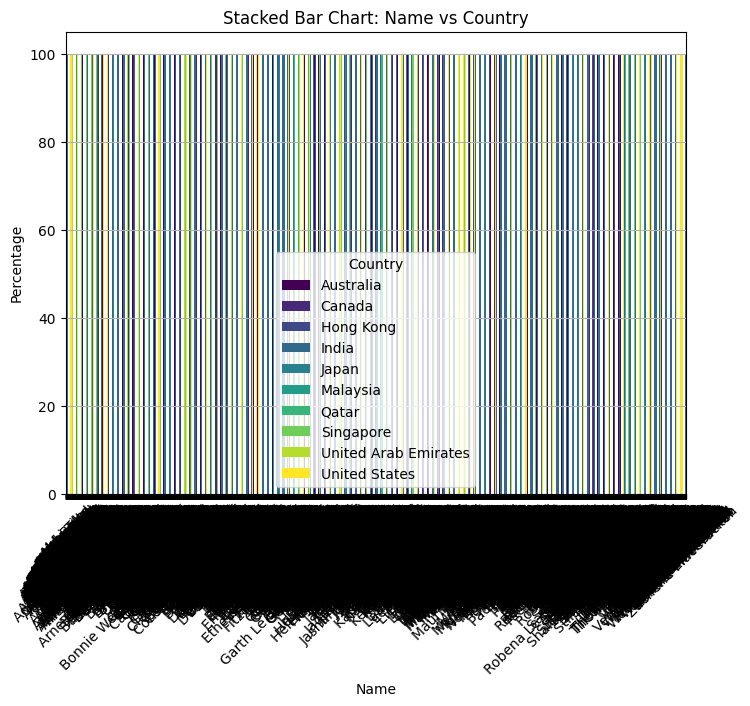

<Figure size 800x600 with 0 Axes>

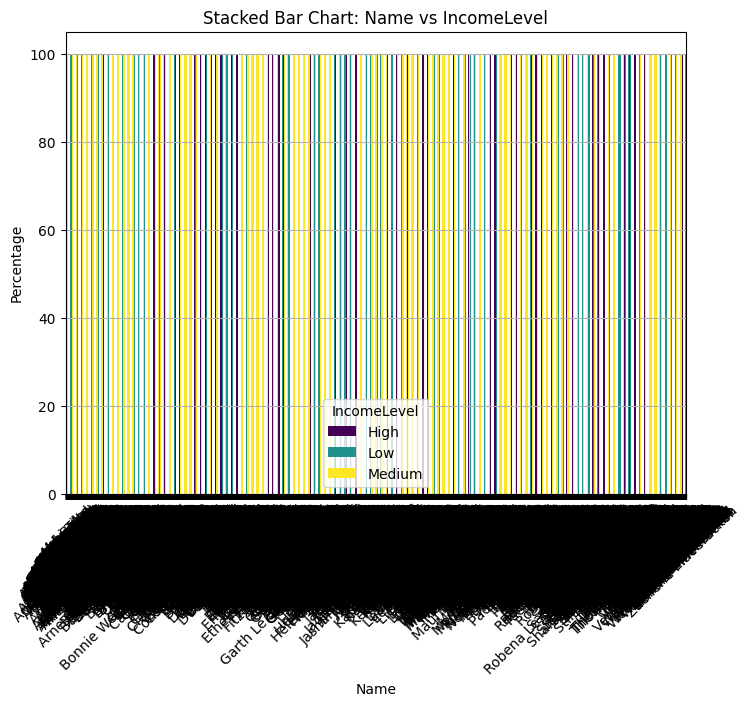

<Figure size 800x600 with 0 Axes>

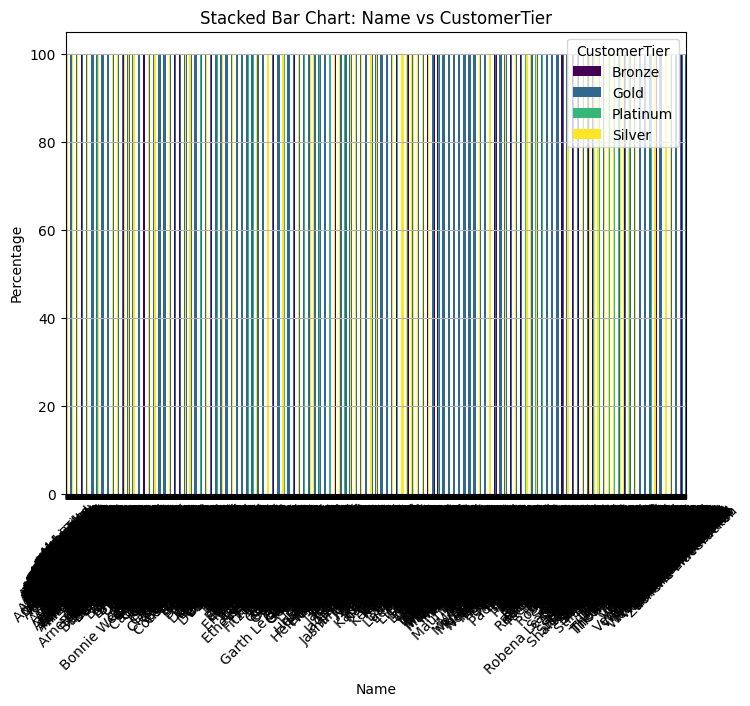

In [ ]:
for i, cat_col1 in enumerate(categorical_cols):
    for cat_col2 in categorical_cols[i + 1:]:
        plt.figure(figsize=(8, 6))
        crosstab = pd.crosstab(data[cat_col1], data[cat_col2], normalize='index') * 100
        crosstab.plot(kind='bar', stacked=True, figsize=(8, 6), colormap='viridis')
        plt.title(f'Stacked Bar Chart: {cat_col1} vs {cat_col2}')
        plt.xlabel(cat_col1)
        plt.ylabel('Percentage')
        plt.xticks(rotation=45)
        plt.grid(axis='y')
        plt.show()

## ***Multivariate Analysis***

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1615: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=x, y=y, **kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1615: UserWarning: Ignoring `palette` because no `hue` variable has be

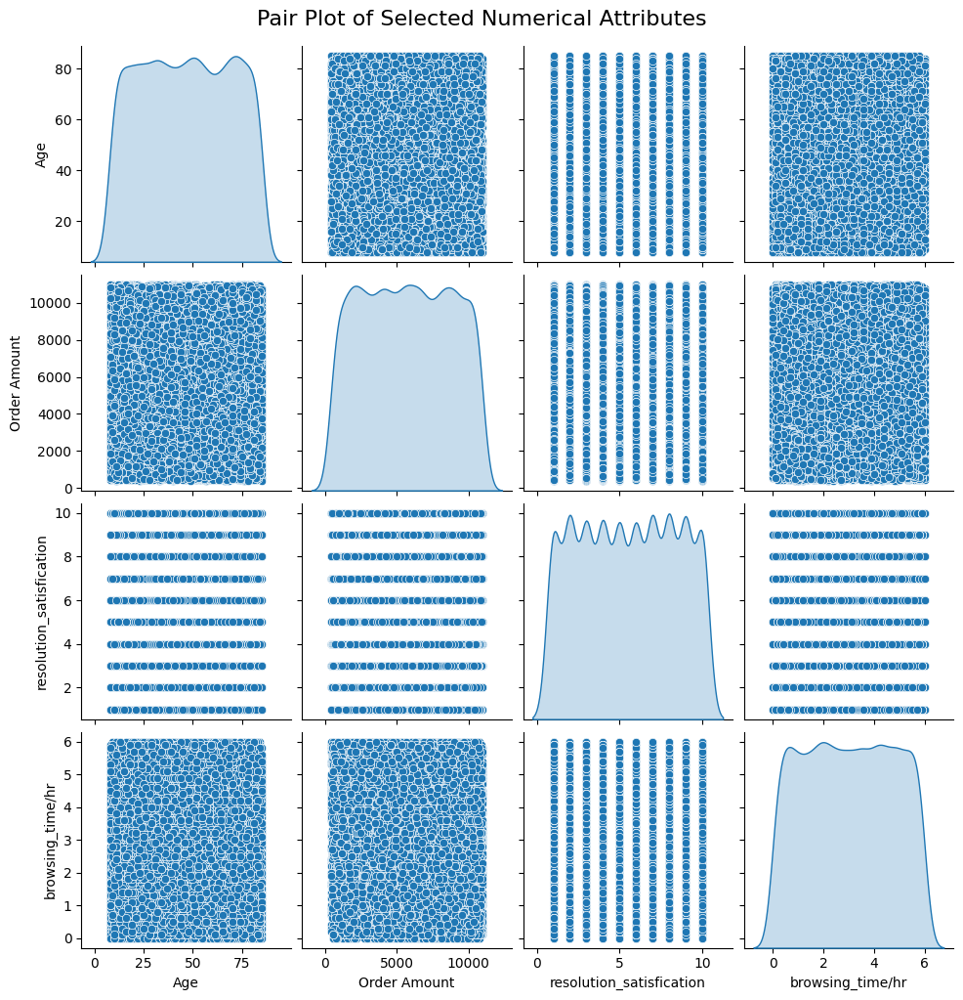

In [ ]:
# Corrected list of selected numeric columns
selected_numeric_cols = ["Age", "IncomeLevel", "Order Amount", "resolution_satisfication", "browsing_time/hr"]

# Pair plot
import seaborn as sns
import matplotlib.pyplot as plt

sns.pairplot(df[selected_numeric_cols], diag_kind="kde", palette="husl")
plt.suptitle("Pair Plot of Selected Numerical Attributes", y=1.02, fontsize=16)
plt.show()


In [ ]:
df.columns


Index(['CustomerID', 'Name', 'Age', 'Gender', 'Country', 'IncomeLevel',
       'CustomerTier', 'Date', 'Product Type', 'Channel Type', 'Order Amount',
       'support_interacation_count', 'problem type', 'support_resolution_time',
       'resolution_satisfication', 'website_logins/day', 'browsing_time/hr',
       'email_open_rate', 'ChurnIndicator'],
      dtype='object')

In [ ]:
import matplotlib.pyplot as plt
plt.scatter(df['Variable1'], df['Variable2'])
plt.xlabel('Variable1')
plt.ylabel('Variable2')
plt.title('Scatter Plot')
plt.show()


NameError: name 'df' is not defined